# **0. Load Preliminary Functions**

# a. Import Libraries and Functions

In [ ]:
%pip install torchdiffeq

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import torchdiffeq

from torchvision import datasets
from torchvision import models
from torchvision import transforms
from torch.autograd import Variable
from torchvision.utils import make_grid
from torchvision.transforms import ToPILImage

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from mpl_toolkits.mplot3d import Axes3D
from tqdm.notebook import tqdm
import numpy as np
import pickle
import itertools
import math


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


# b. MNIST Data Loader

In [4]:
tensor_transform = transforms.Compose([
    transforms.ToTensor()
])

batch_size = 256
train_dataset = datasets.MNIST(root = "./data",
									train = True,
									download = True,
									transform = tensor_transform)
test_dataset = datasets.MNIST(root = "./data",
									train = False,
									download = True,
									transform = tensor_transform)

train_loader = torch.utils.data.DataLoader(dataset = train_dataset,
							   batch_size = batch_size,
								 shuffle = True)
test_loader = torch.utils.data.DataLoader(dataset = test_dataset,
							   batch_size = batch_size,
								 shuffle = False)


# **1. Class Conditional Conditional Flow Matching**

# a. Building Blocks

In [6]:
class ResidualConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.same_channels = in_channels==out_channels
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, 1, 1),
            nn.BatchNorm2d(out_channels),
            nn.GELU(),
        )

    def forward(self, x: torch.Tensor) -> torch.Tensor:
          x1 = self.conv1(x)
          x2 = self.conv2(x1)
          if self.same_channels:
              out = x + x2
          else:
              out = x1 + x2
          return out / 1.414


class UnetDown(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetDown, self).__init__()
        layers = [ResidualConvBlock(in_channels, out_channels), nn.MaxPool2d(2)]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        return self.model(x)


class UnetUp(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UnetUp, self).__init__()
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 2, 2),
            ResidualConvBlock(out_channels, out_channels),
            ResidualConvBlock(out_channels, out_channels),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x, skip):
        x = torch.cat((x, skip), 1)
        x = self.model(x)
        return x


class EmbedFC(nn.Module):
    def __init__(self, input_dim, emb_dim):
        super(EmbedFC, self).__init__()
        self.input_dim = input_dim
        layers = [
            nn.Linear(input_dim, emb_dim),
            nn.GELU(),
            nn.Linear(emb_dim, emb_dim),
        ]
        self.model = nn.Sequential(*layers)

    def forward(self, x):
        x = x.view(-1, self.input_dim)
        return self.model(x)


class UNet(nn.Module):
    def __init__(self, in_channels, n_feat = 256, n_classes=10):
        super(UNet, self).__init__()

        self.in_channels = in_channels
        self.n_feat = n_feat
        self.n_classes = n_classes

        self.init_conv = ResidualConvBlock(in_channels, n_feat)

        self.down1 = UnetDown(n_feat, n_feat)
        self.down2 = UnetDown(n_feat, 2 * n_feat)

        self.to_vec = nn.Sequential(nn.AvgPool2d(7), nn.GELU())

        self.timeembed1 = EmbedFC(1, 2*n_feat)
        self.timeembed2 = EmbedFC(1, 1*n_feat)
        self.contextembed1 = EmbedFC(n_classes, 2*n_feat)
        self.contextembed2 = EmbedFC(n_classes, 1*n_feat)

        self.up0 = nn.Sequential(
            nn.ConvTranspose2d(2 * n_feat, 2 * n_feat, 7, 7),
            nn.GroupNorm(8, 2 * n_feat),
            nn.ReLU(),
        )

        self.up1 = UnetUp(4 * n_feat, n_feat)
        self.up2 = UnetUp(2 * n_feat, n_feat)
        self.out = nn.Sequential(
            nn.Conv2d(2 * n_feat, n_feat, 3, 1, 1),
            nn.GroupNorm(8, n_feat),
            nn.ReLU(),
            nn.Conv2d(n_feat, self.in_channels, 3, 1, 1),
        )

    def forward(self, x, t):
        x = self.init_conv(x)
        down1 = self.down1(x)
        down2 = self.down2(down1)
        hiddenvec = self.to_vec(down2)

        temb1 = self.timeembed1(t).view(-1, self.n_feat * 2, 1, 1)
        temb2 = self.timeembed2(t).view(-1, self.n_feat, 1, 1)

        up1 = self.up0(hiddenvec)
        up2 = self.up1(up1 + temb1, down2)
        up3 = self.up2(up2 + temb2, down1)
        up2 = self.up1(up1 + temb1, down2)
        up3 = self.up2(up2 + temb2, down1)
        out = self.out(torch.cat((up3, x), 1))
        return out

# b. Optimal Transport Conditional Vector Fields

In [8]:
def pad_t_like_x(t, x):
    if isinstance(t, (float, int)):
        return t
    return t.reshape(-1, *([1] * (x.dim() - 1)))


class ConditionalFlowMatcher:
    def __init__(self, sigma = 0.0):
        self.sigma = sigma
    def compute_mu_t(self, x0, x1, t):
        ##################
        ### Problem 1 (a): mean_t
        ##################
        return pad_t_like_x(t, x1)*x1

    def compute_sigma_t(self, t):
        
        ##################
        ### Problem 1 (b): sigma_t
        ##################

        return 1-(1-self.sigma)*t

    def compute_conditional_flow(self, x0, x1, t, xt):
        
        ##################
        ### Problem 1 (c): ut(x1|x0)
        ##################
        t=pad_t_like_x(t, x1)
        
        return (x1-(1-self.sigma)*xt)/self.compute_sigma_t(t)
        
    def sample_xt(self, x0, x1, t, epsilon):
        
        ##################
        ### Problem 1 (d): xt
        ##################
        
        mu=self.compute_mu_t( x0, x1, t)
        sigma=self.compute_sigma_t(t).unsqueeze(-1).unsqueeze(-1).unsqueeze(-1)
        
        return sigma*epsilon+mu

    def sample_noise_like(self, x):
        return torch.randn_like(x)

    def sample_location_and_conditional_flow(self, x0, x1, t=None, return_noise=False):
        if t is None:
            t = torch.rand(x0.shape[0]).type_as(x0)
        assert len(t) == x0.shape[0], "t has to have batch size dimension"

        eps = self.sample_noise_like(x0)
        xt = self.sample_xt(x0, x1, t, eps)
        ut = self.compute_conditional_flow(x0, x1, t, xt)
        if return_noise:
            return t, xt, ut, eps
        else:
            return t, xt, ut

# c. Training Functions

In [13]:
def train_main_loop(n_epochs, optimizer, FM, model):
  for epoch in range(n_epochs):
      print(f'epoch {epoch}')
      pbar = tqdm(train_loader)
      for i, data in enumerate(pbar):
          optimizer.zero_grad()
          x1 = data[0].to(device)
          x0 = torch.randn_like(x1)
          t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
          vt = model(xt, t)
          loss = torch.mean((vt - ut) ** 2)
          loss.backward()
          optimizer.step()
          pbar.set_description(f"loss: {loss.item():.4f}")

      with torch.no_grad():
          traj = torchdiffeq.odeint(
              lambda t, x: model.forward(x, t),
              torch.randn(100, 1, 28, 28, device=device),
              torch.linspace(0, 1, 2, device=device),
              atol=1e-4,
              rtol=1e-4,
              method="dopri5",
          )

      grid = make_grid(
          traj[-1, :100].view([-1, 1, 28, 28]).clip(0, 1), value_range=(0, 1), padding=0, nrow=10
      )

      img = ToPILImage()(grid)
      plt.imshow(img)
      plt.show()

# e. Training


epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

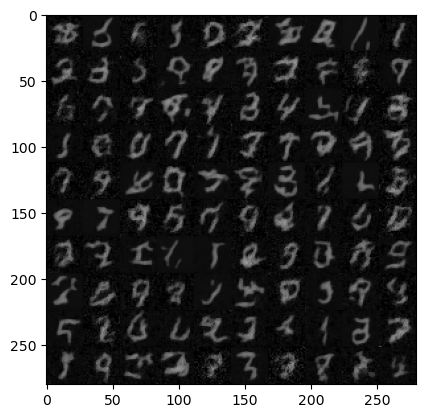

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

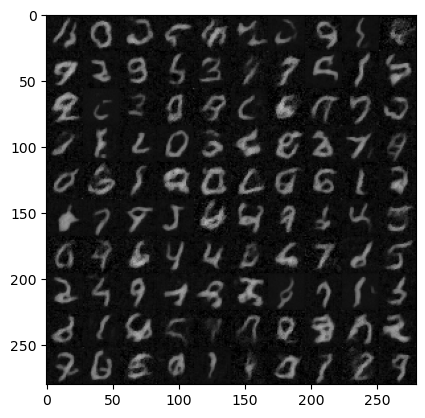

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

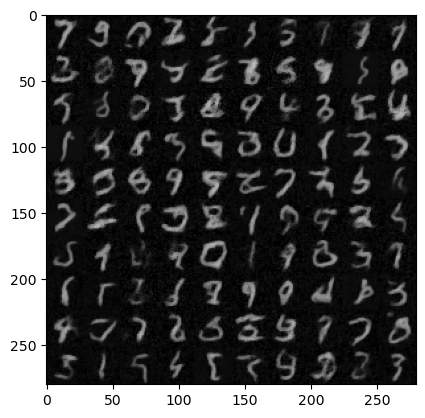

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

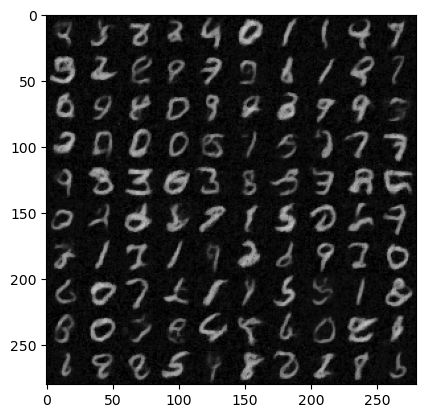

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

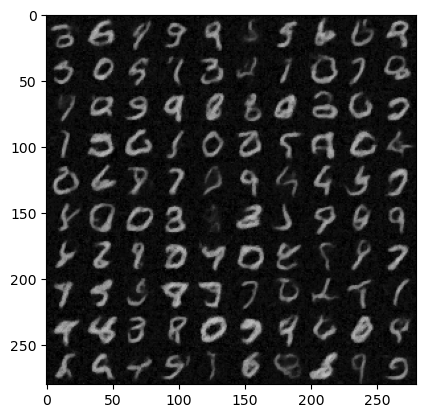

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

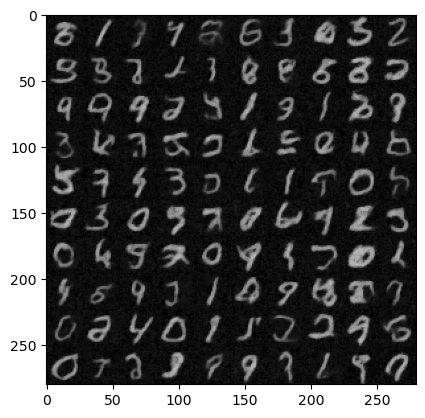

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

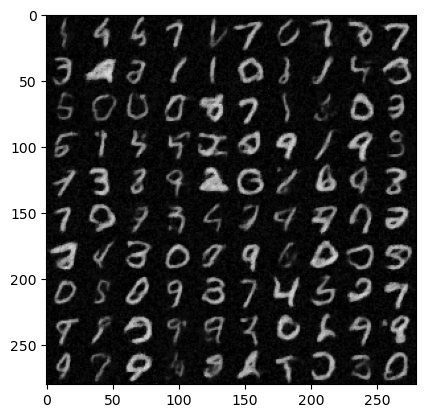

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

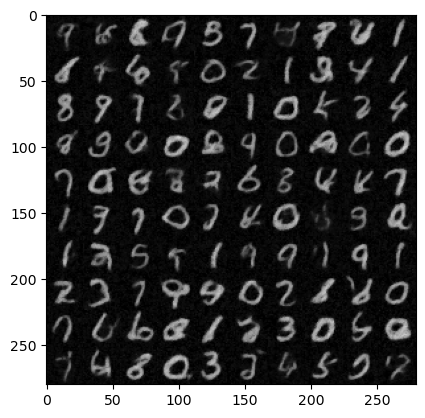

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

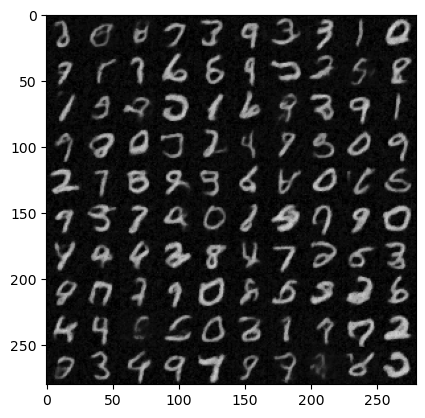

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

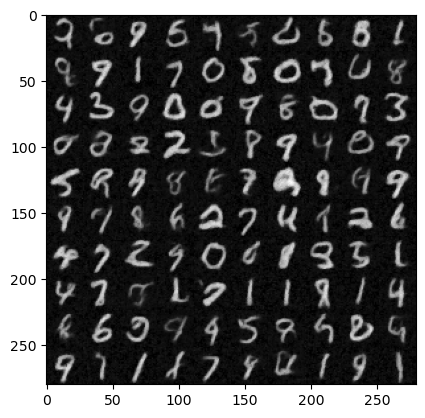

In [20]:
##################
### Problem 1 (e): training
sigma = 0.0
n_feat = 128
n_epochs = 10

model = UNet(in_channels=1, n_feat=n_feat, n_classes=10).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
FM = ConditionalFlowMatcher(sigma=sigma)

train_main_loop(n_epochs, optimizer, FM, model)
##################


# **2. Ablation Study**

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

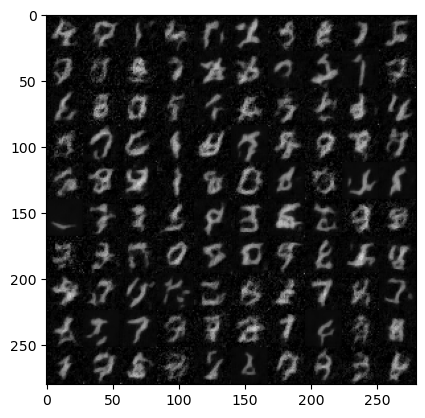

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

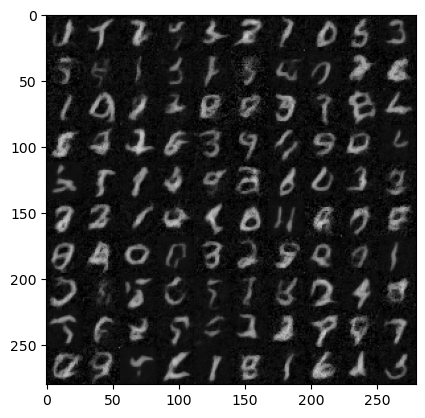

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

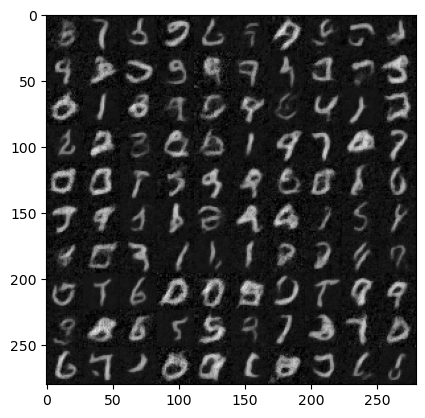

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

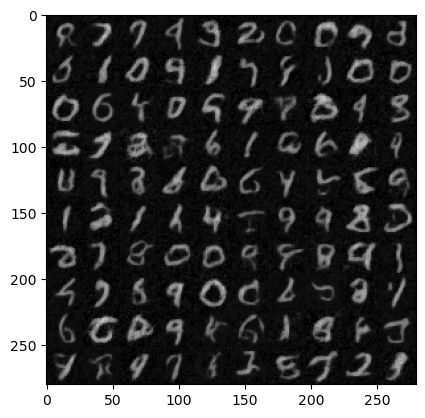

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

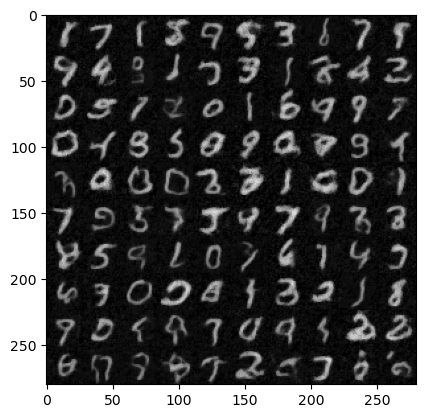

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

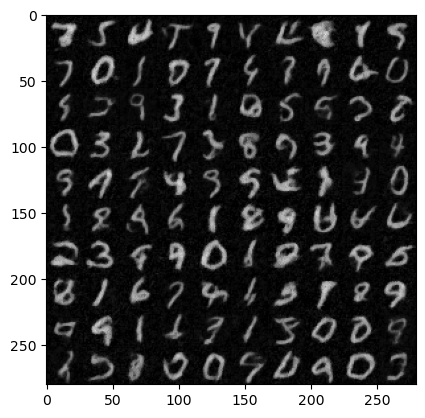

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

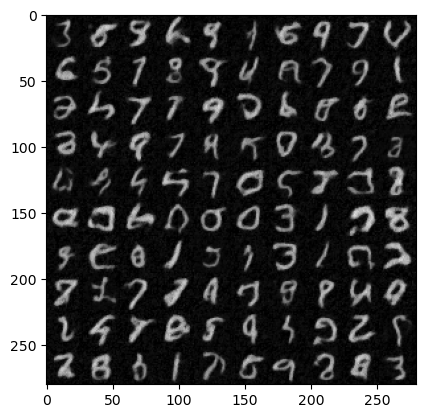

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

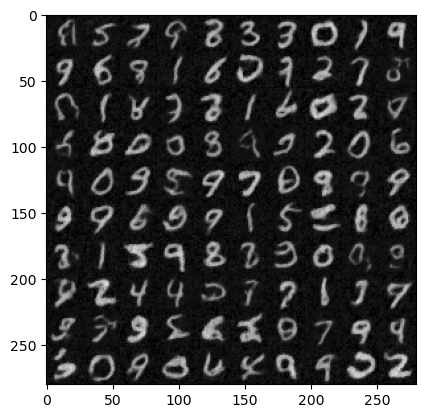

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

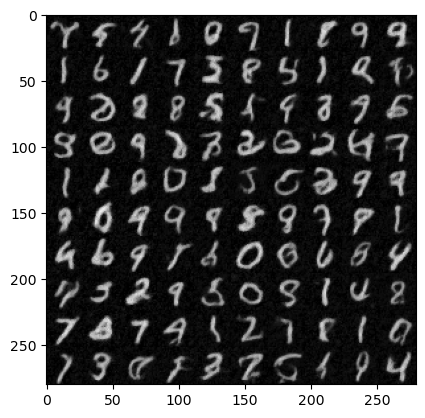

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

In [ ]:
##################
### Problem 2: Ablation Study
##################
def train_main_loop_bosh3(n_epochs, optimizer, FM, model):
  for epoch in range(n_epochs):
      print(f'epoch {epoch}')
      pbar = tqdm(train_loader)
      for i, data in enumerate(pbar):
          optimizer.zero_grad()
          x1 = data[0].to(device)
          x0 = torch.randn_like(x1)
          t, xt, ut = FM.sample_location_and_conditional_flow(x0, x1)
          vt = model(xt, t)
          loss = torch.mean((vt - ut) ** 2)
          loss.backward()
          optimizer.step()
          pbar.set_description(f"loss: {loss.item():.4f}")

      with torch.no_grad():
          traj = torchdiffeq.odeint(
              lambda t, x: model.forward(x, t),
              torch.randn(100, 1, 28, 28, device=device),
              torch.linspace(0, 1, 2, device=device),
              atol=1e-4,
              rtol=1e-4,
              method="bosh3",
          )

      grid = make_grid(
          traj[-1, :100].view([-1, 1, 28, 28]).clip(0, 1), value_range=(0, 1), padding=0, nrow=10
      )

      img = ToPILImage()(grid)
      plt.imshow(img)
      plt.show()

sigma = 0.0
n_feat = 128
n_epochs = 10

model = UNet(in_channels=1, n_feat=n_feat, n_classes=10).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
FM = ConditionalFlowMatcher(sigma=sigma)

train_main_loop_bosh3(n_epochs, optimizer, FM, model)

epoch 0


  0%|          | 0/235 [00:00<?, ?it/s]

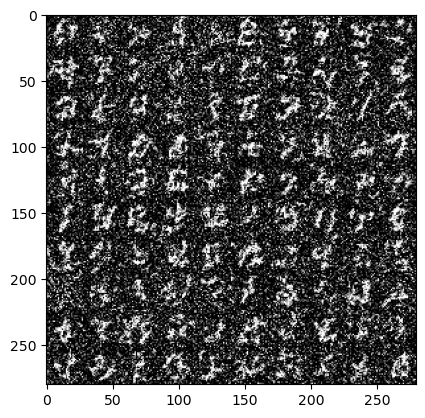

epoch 1


  0%|          | 0/235 [00:00<?, ?it/s]

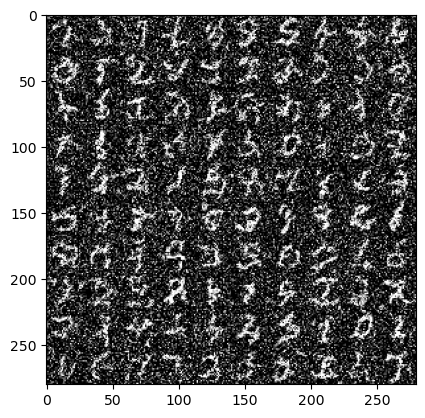

epoch 2


  0%|          | 0/235 [00:00<?, ?it/s]

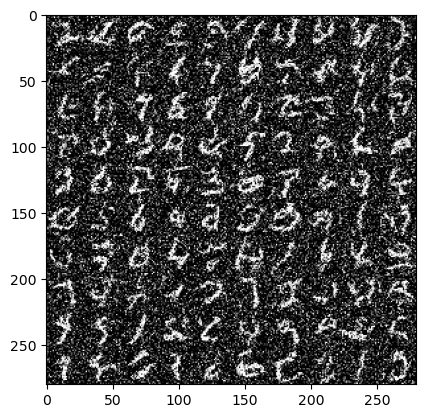

epoch 3


  0%|          | 0/235 [00:00<?, ?it/s]

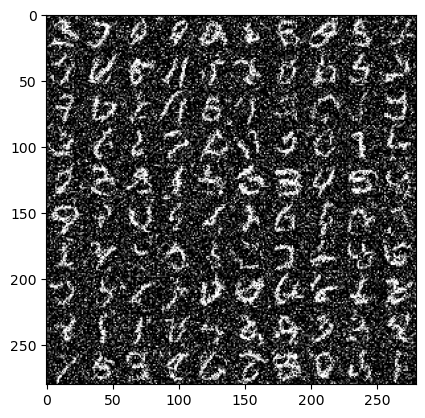

epoch 4


  0%|          | 0/235 [00:00<?, ?it/s]

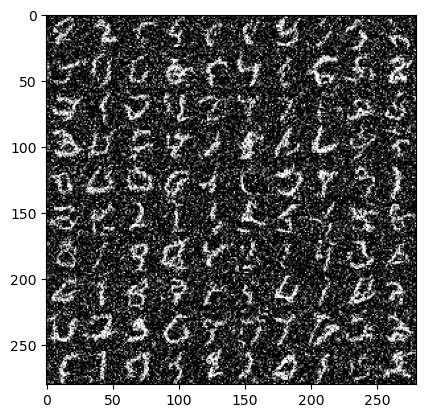

epoch 5


  0%|          | 0/235 [00:00<?, ?it/s]

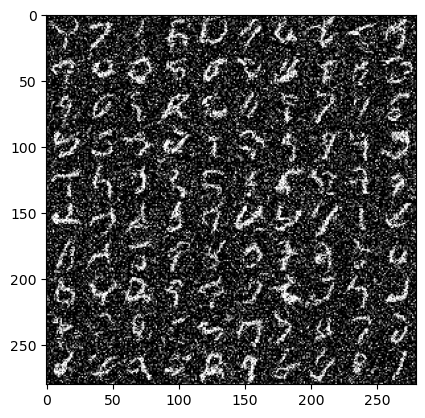

epoch 6


  0%|          | 0/235 [00:00<?, ?it/s]

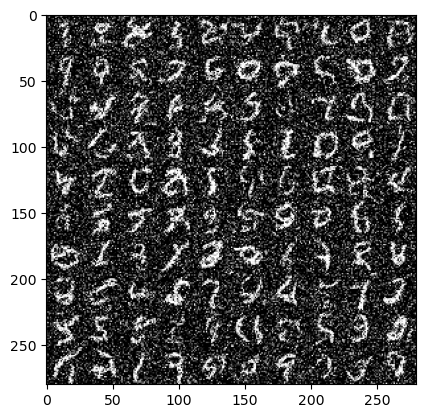

epoch 7


  0%|          | 0/235 [00:00<?, ?it/s]

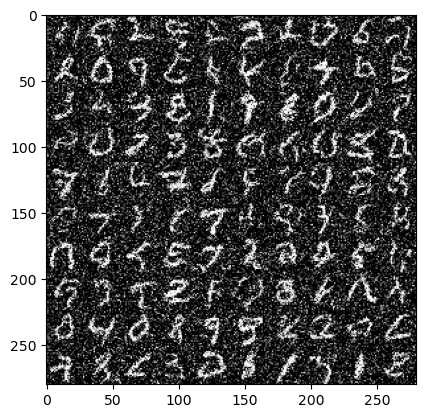

epoch 8


  0%|          | 0/235 [00:00<?, ?it/s]

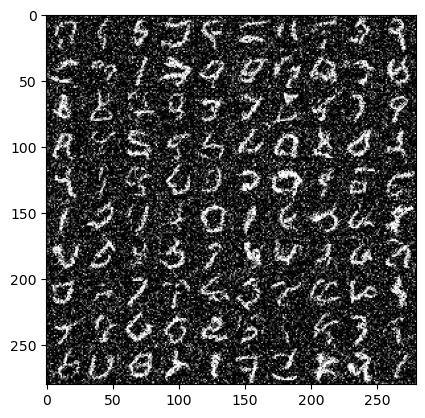

epoch 9


  0%|          | 0/235 [00:00<?, ?it/s]

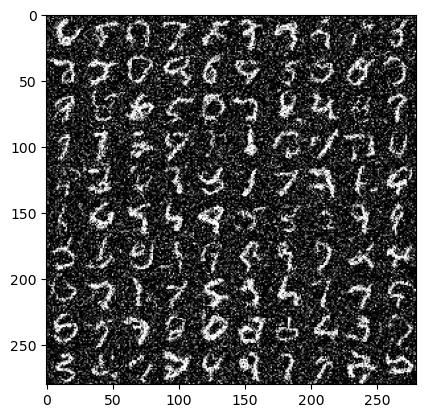

epoch 10


  0%|          | 0/235 [00:00<?, ?it/s]

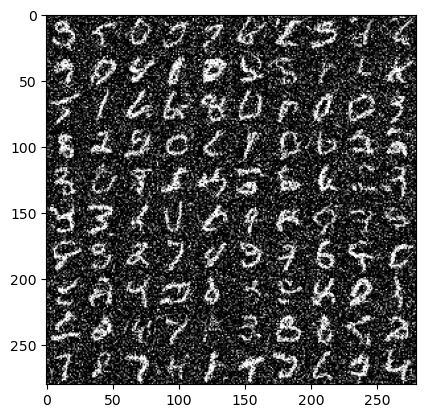

epoch 11


  0%|          | 0/235 [00:00<?, ?it/s]

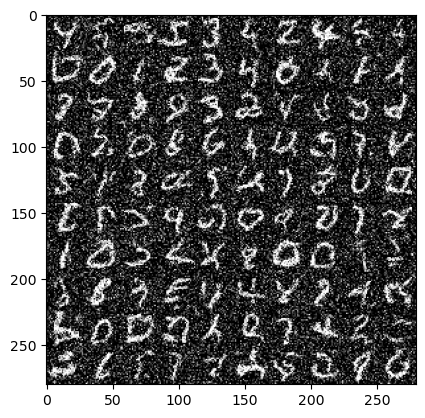

epoch 12


  0%|          | 0/235 [00:00<?, ?it/s]

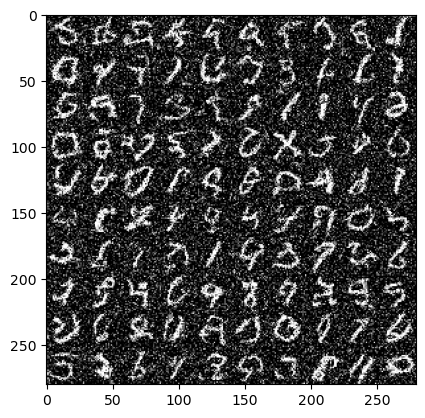

epoch 13


  0%|          | 0/235 [00:00<?, ?it/s]

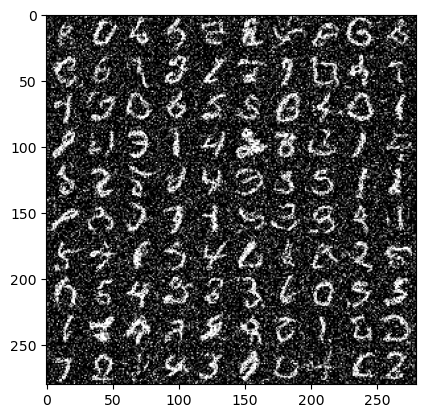

epoch 14


  0%|          | 0/235 [00:00<?, ?it/s]

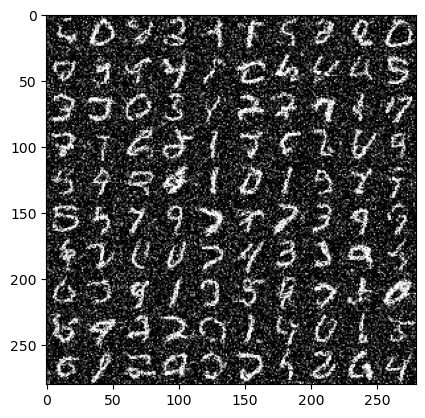

epoch 15


  0%|          | 0/235 [00:00<?, ?it/s]

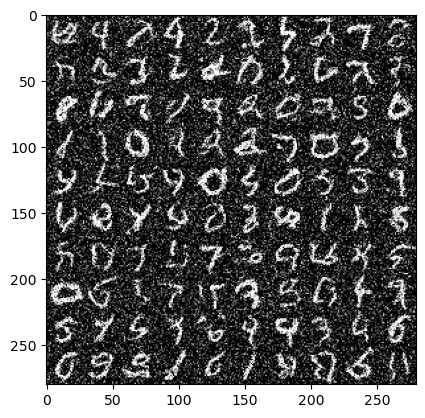

epoch 16


  0%|          | 0/235 [00:00<?, ?it/s]

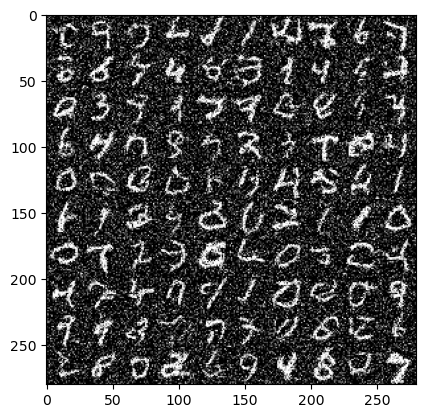

epoch 17


  0%|          | 0/235 [00:00<?, ?it/s]

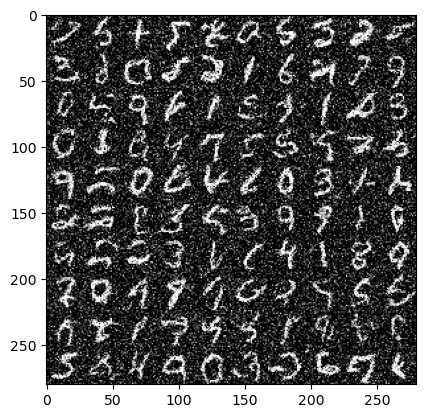

epoch 18


  0%|          | 0/235 [00:00<?, ?it/s]

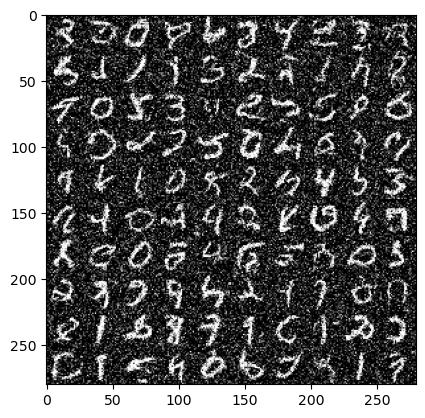

epoch 19


  0%|          | 0/235 [00:00<?, ?it/s]

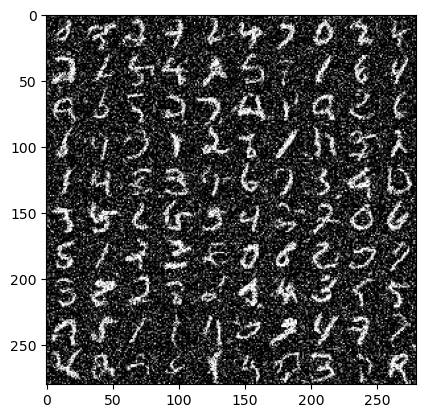

In [19]:
##################
### Problem 2: Diffusion conditional VFs
##################
def pad_t_like_x(t, x):
    if isinstance(t, (float, int)):
        return t
    return t.reshape(-1, *([1] * (x.dim() - 1)))


class ConditionalFlowMatcher_DMVF:
    def __init__(self, beta=[0.1,20.0]):
        
        self.beta1=beta[0]
        self.beta2=beta[1]
    def compute_mu_t(self, x0, x1, t):
        ##################
        ### Problem 2 : mean_t
        ##################
        
        alpha=torch.exp(-0.5*self.compute_T(1-t))
        
        return alpha*x1

    def compute_sigma_t(self, t):
        
        ##################
        ### Problem 2 : sigma_t
        ##################
        
        alpha=torch.exp(-0.5*self.compute_T(1-t))
        
        return torch.sqrt(1-alpha**2)

    def compute_conditional_flow(self, x0, x1, t, xt):
        ##################
        ### Problem 2: Diffusion conditional VFs
        ##################
        t=pad_t_like_x(t, x1)
        mt=(-1.0)*self.compute_T(1-t)
        u=-self.compute_dT(1-t)/2*(torch.exp(mt)*xt-torch.exp(0.5*mt)*x1)/(1-torch.exp(mt)+1e-5)
       
        return u

    def compute_T(self,t):
        return t*self.beta1+0.5*t*t*(self.beta2-self.beta1)

    def compute_dT(self,t):
        return self.beta1+t*(self.beta2-self.beta1)
        
    def sample_xt(self, x0, x1, t, epsilon):
        ###################
        ### Problem 2: Diffusion conditional VFs
        ###################
        t=pad_t_like_x(t, x1)
        mu=self.compute_mu_t(x0,x1,t)
        std=self.compute_sigma_t(t)
        return std*epsilon+mu

    def sample_noise_like(self, x):
        return torch.randn_like(x)

    def sample_location_and_conditional_flow(self, x0, x1, t=None, return_noise=False):
        if t is None:
            t = torch.rand(x0.shape[0]).type_as(x0)
        assert len(t) == x0.shape[0], "t has to have batch size dimension"

        eps = self.sample_noise_like(x0)
        xt = self.sample_xt(x0, x1, t, eps)
        ut = self.compute_conditional_flow(x0, x1, t, xt)
        if return_noise:
            return t, xt, ut, eps
        else:
            return t, xt, ut



sigma = 0.0
n_feat = 128
n_epochs = 20

model = UNet(in_channels=1, n_feat=n_feat, n_classes=10).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
FM = ConditionalFlowMatcher_DMVF(beta=[0.1,5.0])

train_main_loop(n_epochs, optimizer, FM, model)

This result seems not so good, so I think I should check my implementation of Diffusion Vector Field.

The following code structure is mainly referenced from [MIT Computer Science Class 6.S184: Generative AI with Stochastic Differential Equations](https://diffusion.csail.mit.edu/)

For details, see lab2 of this course.

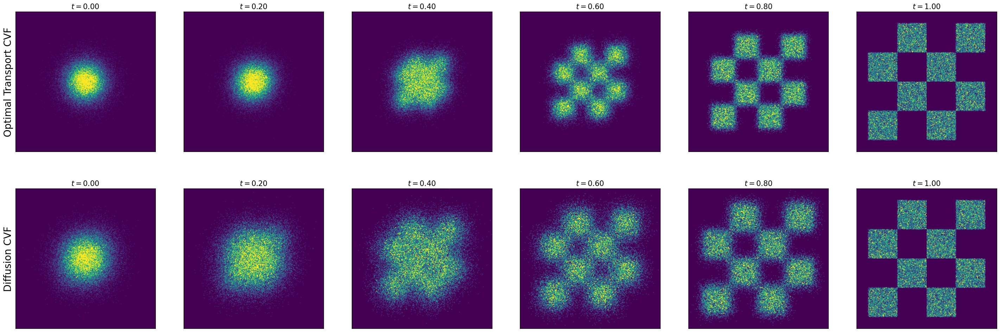

In [30]:
from abc import ABC, abstractmethod
from typing import Optional, List, Type, Tuple, Dict
from matplotlib.axes._axes import Axes
import matplotlib.cm as cm
class Sampleable(ABC):
    """
    Distribution which can be sampled from
    """
    @property
    @abstractmethod
    def dim(self) -> int:
        """
        Returns:
            - Dimensionality of the distribution
        """
        pass
        
    @abstractmethod
    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Args:
            - num_samples: the desired number of samples
        Returns:
            - samples: shape (batch_size, dim)
        """
        pass

class Density(ABC):
    """
    Distribution with tractable density
    """
    @abstractmethod
    def log_density(self, x: torch.Tensor) -> torch.Tensor:
        """
        Returns the log density at x.
        Args:
            - x: shape (batch_size, dim)
        Returns:
            - log_density: shape (batch_size, 1)
        """
        pass

class Gaussian(torch.nn.Module, Sampleable, Density):
    """
    Multivariate Gaussian distribution
    """
    def __init__(self, mean: torch.Tensor, cov: torch.Tensor):
        """
        mean: shape (dim,)
        cov: shape (dim,dim)
        """
        super().__init__()
        self.register_buffer("mean", mean)
        self.register_buffer("cov", cov)

    @property
    def dim(self) -> int:
        return self.mean.shape[0]

    @property
    def distribution(self):
        return D.MultivariateNormal(self.mean, self.cov, validate_args=False)

    def sample(self, num_samples) -> torch.Tensor:
        return self.distribution.sample((num_samples,))
        
    def log_density(self, x: torch.Tensor):
        return self.distribution.log_prob(x).view(-1, 1)

    @classmethod
    def isotropic(cls, dim: int, std: float) -> "Gaussian":
        mean = torch.zeros(dim)
        cov = torch.eye(dim) * std ** 2
        return cls(mean, cov)


class CheckerboardSampleable(Sampleable):
    """
    Checkboard-esque distribution
    """
    def __init__(self, device: torch.device, grid_size: int = 3, scale=5.0):
        """
        Args:
            noise: standard deviation of Gaussian noise added to the data
        """
        self.grid_size = grid_size
        self.scale = scale
        self.device = device

    @property
    def dim(self) -> int:
        return 2

    def sample(self, num_samples: int) -> torch.Tensor:
        """
        Args:
            num_samples: number of samples to generate
        Returns:
            torch.Tensor: shape (num_samples, 3)
        """
        grid_length = 2 * self.scale / self.grid_size
        samples = torch.zeros(0,2).to(device)
        while samples.shape[0] < num_samples:
            # Sample num_samples
            new_samples = (torch.rand(num_samples,2).to(self.device) - 0.5) * 2 * self.scale
            x_mask = torch.floor((new_samples[:,0] + self.scale) / grid_length) % 2 == 0 # (bs,)
            y_mask = torch.floor((new_samples[:,1] + self.scale) / grid_length) % 2 == 0 # (bs,)
            accept_mask = torch.logical_xor(~x_mask, y_mask)
            samples = torch.cat([samples, new_samples[accept_mask]], dim=0)
        return samples[:num_samples]

class ConditionalProbabilityPath(torch.nn.Module, ABC):
    """
    Abstract base class for conditional probability paths
    """
    def __init__(self, p_simple: Sampleable, p_data: Sampleable):
        super().__init__()
        self.p_simple = p_simple
        self.p_data = p_data

    def sample_marginal_path(self, t: torch.Tensor) -> torch.Tensor:
        """
        Samples from the marginal distribution p_t(x) = p_t(x|z) p(z)
        Args:
            - t: time (num_samples, 1)
        Returns:
            - x: samples from p_t(x), (num_samples, dim)
        """
        num_samples = t.shape[0]
        # Sample conditioning variable z ~ p(z)
        z = self.sample_conditioning_variable(num_samples) # (num_samples, dim)
        # Sample conditional probability path x ~ p_t(x|z)
        x = self.sample_conditional_path(z, t) # (num_samples, dim)
        return x

    @abstractmethod
    def sample_conditioning_variable(self, num_samples: int) -> torch.Tensor:
        """
        Samples the conditioning variable z
        Args:
            - num_samples: the number of samples
        Returns:
            - z: samples from p(z), (num_samples, dim)
        """
        pass
    
    @abstractmethod
    def sample_conditional_path(self, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        samples from p_t(x|z), (num_samples, dim)
        """
        pass
        
    @abstractmethod
    def conditional_vector_field(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluates the conditional vector field u_t(x|z)
        """ 
        pass

    

class OptimalTransportConditionalProbabilityPath(ConditionalProbabilityPath):
    def __init__(self, p_simple: Sampleable, p_data: Sampleable,sigma=0.0):
        super().__init__(p_simple, p_data)
        self.sigma=sigma
    def sample_conditioning_variable(self, num_samples: int) -> torch.Tensor:
        return self.p_data.sample(num_samples)
    
    def compute_mu_t(self,x1, t):
        return t*x1

    def compute_sigma_t(self, t):
        return 1-(1-self.sigma)*t
    
    def sample_conditional_path(self, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        samples from p_t(x|z), (num_samples, dim)
        """
        b,d=z.shape
        x0=torch.distributions.MultivariateNormal(torch.zeros((d,),device=z.device),torch.eye(d,device=z.device)).sample((b,))
        mu=self.compute_mu_t(z,t)
        std=self.compute_sigma_t(t)
        return std*x0+mu
        
        
    def conditional_vector_field(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluates the conditional vector field u_t(x|z)
        """ 
        return (z-(1-self.sigma)*x)/self.compute_sigma_t(t)
    
class DiffusionVFProbabilityPath(ConditionalProbabilityPath):
    def __init__(self, p_simple: Sampleable, p_data: Sampleable,betas=[0.1,20.0]):
        super().__init__(p_simple, p_data)
        assert betas[0]<betas[1]
        self.beta1=betas[0]
        self.beta2=betas[1]
    def sample_conditioning_variable(self, num_samples: int) -> torch.Tensor:
        return self.p_data.sample(num_samples)
    
    def compute_T(self,t: torch.Tensor):
        """ T(t)=int_{0}^{t}beta1+t(beta2-beta1)dt"""
        return t*self.beta1+0.5*t*t*(self.beta2-self.beta1)

    def compute_dT(self,t: torch.Tensor):
        return self.beta1+t*(self.beta2-self.beta1)
    
    def compute_mu_t(self,x1, t):
        
        
        alpha=torch.exp(-0.5*self.compute_T(1-t))
        
        return alpha*x1

    def compute_sigma_t(self, t):
        
        alpha=torch.exp(-0.5*self.compute_T(1-t))
        
        return torch.sqrt(1-alpha**2)
    
    def sample_conditional_path(self, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        samples from p_t(x|z)
        """
        b,d=z.shape
        x0=torch.distributions.MultivariateNormal(torch.zeros((d,),device=z.device),torch.eye(d,device=z.device)).sample((b,))
        mu=self.compute_mu_t(z,t)
        std=self.compute_sigma_t(t)
        return std*x0+mu
        
        
    def conditional_vector_field(self, x: torch.Tensor, z: torch.Tensor, t: torch.Tensor) -> torch.Tensor:
        """
        Evaluates the conditional vector field u_t(x|z)
        """ 
        mt=(-1.0)*self.compute_T(1-t)
        u=-self.compute_dT(1-t)/2*(torch.exp(mt)*x-torch.exp(0.5*mt)*z)/(1-torch.exp(mt)+1e-5)
        return u
    

def hist2d_samples(samples, ax: Optional[Axes] = None, bins: int = 200, scale: float = 5.0, percentile: int = 99, **kwargs):
    H, xedges, yedges = np.histogram2d(samples[:, 0], samples[:, 1], bins=bins, range=[[-scale, scale], [-scale, scale]])
    
    # Determine color normalization based on the 99th percentile
    cmax = np.percentile(H, percentile)
    cmin = 0.0
    norm = cm.colors.Normalize(vmax=cmax, vmin=cmin)
    
    # Plot using imshow for more control
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]
    ax.imshow(H.T, extent=extent, origin='lower', norm=norm, **kwargs)
    

path = OptimalTransportConditionalProbabilityPath(
        p_simple = Gaussian.isotropic(dim=2, std=1.0),
        p_data = CheckerboardSampleable(device, grid_size=4)
    ).to(device)
    
num_samples = 50000
num_marginals = 6
    
fig, axes = plt.subplots(2, num_marginals, figsize=(6 * num_marginals, 6 * 2))
axes = axes.reshape(2, num_marginals)
scale = 6.0
    
    
    ###########################
    ### Optimal Transport Conditional Vector Field
    ###########################
ts = torch.linspace(0.0, 1.0, num_marginals).to(device)
for idx, t in enumerate(ts):
        tt = t.view(1,1).expand(num_samples,1)
        xts = path.sample_marginal_path(tt)
        hist2d_samples(samples=xts.cpu(), ax=axes[0, idx], bins=200, scale=scale, percentile=99, alpha=1.0)
        axes[0, idx].set_xlim(-scale, scale)
        axes[0, idx].set_ylim(-scale, scale)
        axes[0, idx].set_xticks([])
        axes[0, idx].set_yticks([])
        axes[0, idx].set_title(f'$t={t.item():.2f}$', fontsize=15)
axes[0, 0].set_ylabel("Optimal Transport CVF", fontsize=20)
    ###############################################
    ### Diffusion conditional VF
    ###############################################
path=DiffusionVFProbabilityPath(
        p_simple = Gaussian.isotropic(dim=2, std=1.0),
        p_data = CheckerboardSampleable(device, grid_size=4),
        betas=[0.1,5]
    ).to(device)
    
ts = torch.linspace(0.0, 1.0, num_marginals).to(device)
for idx, t in enumerate(ts):
        tt = t.view(1,1).expand(num_samples,1)
        xts = path.sample_marginal_path(tt)
        hist2d_samples(samples=xts.cpu(), ax=axes[1, idx], bins=200, scale=scale, percentile=99, alpha=1.0)
        axes[1, idx].set_xlim(-scale, scale)
        axes[1, idx].set_ylim(-scale, scale)
        axes[1, idx].set_xticks([])
        axes[1, idx].set_yticks([])
        axes[1, idx].set_title(f'$t={t.item():.2f}$', fontsize=15)
axes[1, 0].set_ylabel("Diffusion CVF", fontsize=20) 
    
plt.show()


Notice that these two vector fields behave similarly, I think my implementation is right, so the bad result may due to the hyper parameters……

# **3. Gaussian to Gaussian (2D) using a conditional flow**

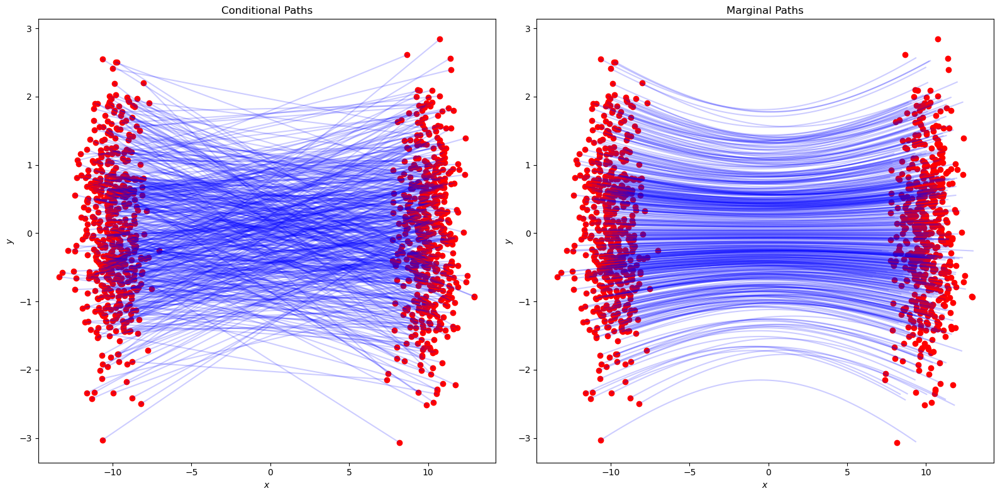

In [320]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal
from tqdm import tqdm

mu = 10
n_samples = 500
n_steps = 100
t_values = np.linspace(0, 1, n_steps)
t_values = t_values

mean_start = np.array([-mu, 0])
mean_end = np.array([mu, 0])
covariance = np.eye(2)

x0_samples = np.random.multivariate_normal(mean_start, covariance, n_samples)
x1_samples = np.random.multivariate_normal(mean_end, covariance, n_samples)

def conditional_paths(x0_samples, x1_samples, mean_end, t_values):
    conditional_paths = []
    for x0, x1 in zip(x0_samples, x1_samples):
        path = [(1 - t) * x0 + t * x1 for t in t_values]
        conditional_paths.append(np.array(path))
    return np.array(conditional_paths)

def marginal_flow(x, t):
    
    ##################
    ### Problem 3(b): u(x_t)
    ##################
    u1=(1-t)*mean_end-t*mean_start-(1-2*t)*x
    return u1/(1-2*t+2*t*t)
    

def generate_marginal_paths(x0_samples, t_values):
    marginal_paths = []
    for x0 in x0_samples:
        path = [x0]
        x_current = x0
        for t in t_values[1:]:
            u_t = marginal_flow(x_current, t)
            x_current = x_current + u_t * (t_values[1] - t_values[0])
            path.append(x_current)
        marginal_paths.append(np.array(path))
    return np.array(marginal_paths)


conditional_data = conditional_paths(x0_samples, x1_samples, mean_end, t_values)
marginal_data = generate_marginal_paths(x0_samples, t_values)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))

for path in conditional_data:
    axes[0].plot(path[:, 0], path[:, 1], color='blue', alpha=0.2)
axes[0].set_title("Conditional Paths")
axes[0].scatter(x0_samples[:, 0], x0_samples[:, 1], color='red')
axes[0].scatter(x1_samples[:, 0], x1_samples[:, 1], color='red')
axes[0].set_xlabel("$x$")
axes[0].set_ylabel("$y$")

for path in marginal_data:
    axes[1].plot(path[:, 0], path[:, 1], color='blue', alpha=0.2)
axes[1].set_title("Marginal Paths")
axes[1].scatter(x0_samples[:, 0], x0_samples[:, 1], color='red')
axes[1].scatter(x1_samples[:, 0], x1_samples[:, 1], color='red')
axes[1].set_xlabel("$x$")
axes[1].set_ylabel("$y$")

plt.tight_layout()
plt.show()
